In [0]:
# Replace these with your actual AWS credentials
ACCESS_KEY = ""
SECRET_KEY = ""

# Configure Spark to use AWS credentials
spark._jsc.hadoopConfiguration().set("fs.s3a.access.key", ACCESS_KEY)
spark._jsc.hadoopConfiguration().set("fs.s3a.secret.key", SECRET_KEY)
spark._jsc.hadoopConfiguration().set("fs.s3a.endpoint", "s3.amazonaws.com")

# Load the CSV file from your S3 bucket
df = spark.read.format("csv")\
    .option("header", "true")\
    .option("inferSchema", "true")\
    .load("s3a://ashishbucket08/sales_data .csv")

# Show the first few rows



In [0]:
# df = spark.read.csv("dbfs:/FileStore/shared_uploads/ashish258kothari@gmail.com/sales_data_.csv", header = True)

In [0]:
df.show(4)

+--------+--------------------+----------------+----------+--------------+--------------------+
|Order ID|             Product|Quantity Ordered|Price Each|    Order Date|    Purchase Address|
+--------+--------------------+----------------+----------+--------------+--------------------+
|  295665|  Macbook Pro Laptop|               1|      1700| 12/30/19 0:01|136 Church St, Ne...|
|  295666|  LG Washing Machine|               1|       600| 12/29/19 7:03|562 2nd St, New Y...|
|  295667|USB-C Charging Cable|               1|     11.95|12/12/19 18:21|277 Main St, New ...|
|  295668|    27in FHD Monitor|               1|    149.99|12/22/19 15:13|410 6th St, San F...|
+--------+--------------------+----------------+----------+--------------+--------------------+
only showing top 4 rows



In [0]:
df.describe().show()

+-------+-----------------+------------+------------------+------------------+--------------+--------------------+
|summary|         Order ID|     Product|  Quantity Ordered|        Price Each|    Order Date|    Purchase Address|
+-------+-----------------+------------+------------------+------------------+--------------+--------------------+
|  count|           186850|      186850|            186850|            186850|        186850|              186850|
|   mean|230417.5693788653|        null|1.1243828986286637|184.39973476749515|          null|                null|
| stddev|51512.73710999598|        null|  0.44279262402867|332.73132988434395|          null|                null|
|    min|           141234|20in Monitor|                 1|            109.99|01/01/19 10:02|1 11th St, Atlant...|
|    max|             null|        null|              null|              null|          null|                null|
+-------+-----------------+------------+------------------+------------------+--

In [0]:
df.printSchema()

root
 |-- Order ID: string (nullable = true)
 |-- Product: string (nullable = true)
 |-- Quantity Ordered: string (nullable = true)
 |-- Price Each: string (nullable = true)
 |-- Order Date: string (nullable = true)
 |-- Purchase Address: string (nullable = true)



Spark => Dataframe
Spark Functions => to clean
Spark => SQL(to clean and transform)
Spark SQL => component pyspark => we can use sql queries to interact with data


-- sql => Dataframe => SQL table store => Database
-- Database => Tables.  (already created dataframe)

# Creating Database for SQL queries

In [0]:
spark.sql("drop database if exists sales_db cascade")

Out[6]: DataFrame[]

In [0]:
spark.sql("create database if not exists sales_db")
spark.sql("use sales_db")

Out[7]: DataFrame[]

In [0]:
dbutils.fs.rm('dbfs:/user/hive/warehouse/sales_db.db/sales',recurse=True)

Out[8]: True

## Using the same database for all transactions

In [0]:
spark.sql("""  create table if not exists sales(
            OrderId string,
            Product string,
            QuantityOrdered string,
            PriceEach string,
            OrderDate string,
            PurchaseAddress string
)""")

Out[9]: DataFrame[]

In [0]:
spark.sql("select * from sales").show()

+-------+-------+---------------+---------+---------+---------------+
|OrderId|Product|QuantityOrdered|PriceEach|OrderDate|PurchaseAddress|
+-------+-------+---------------+---------+---------+---------------+
+-------+-------+---------------+---------+---------+---------------+



view => virtual table (store the table query)

In [0]:
df.show(2)

+--------+------------------+----------------+----------+-------------+--------------------+
|Order ID|           Product|Quantity Ordered|Price Each|   Order Date|    Purchase Address|
+--------+------------------+----------------+----------+-------------+--------------------+
|  295665|Macbook Pro Laptop|               1|      1700|12/30/19 0:01|136 Church St, Ne...|
|  295666|LG Washing Machine|               1|       600|12/29/19 7:03|562 2nd St, New Y...|
+--------+------------------+----------------+----------+-------------+--------------------+
only showing top 2 rows



In [0]:
df.createOrReplaceTempView("temp_sales")

In [0]:
spark.sql("select * from temp_sales").show(4)

+--------+--------------------+----------------+----------+--------------+--------------------+
|Order ID|             Product|Quantity Ordered|Price Each|    Order Date|    Purchase Address|
+--------+--------------------+----------------+----------+--------------+--------------------+
|  295665|  Macbook Pro Laptop|               1|      1700| 12/30/19 0:01|136 Church St, Ne...|
|  295666|  LG Washing Machine|               1|       600| 12/29/19 7:03|562 2nd St, New Y...|
|  295667|USB-C Charging Cable|               1|     11.95|12/12/19 18:21|277 Main St, New ...|
|  295668|    27in FHD Monitor|               1|    149.99|12/22/19 15:13|410 6th St, San F...|
+--------+--------------------+----------------+----------+--------------+--------------------+
only showing top 4 rows



## Inserting record using the subquery - into sales_raw table

In [0]:
spark.sql(""" insert overwrite sales
              select * from temp_sales """)

Out[14]: DataFrame[num_affected_rows: bigint, num_inserted_rows: bigint]

In [0]:
spark.sql("select * from sales").show(2)

+-------+------------------+---------------+---------+-------------+--------------------+
|OrderId|           Product|QuantityOrdered|PriceEach|    OrderDate|     PurchaseAddress|
+-------+------------------+---------------+---------+-------------+--------------------+
| 295665|Macbook Pro Laptop|              1|     1700|12/30/19 0:01|136 Church St, Ne...|
| 295666|LG Washing Machine|              1|      600|12/29/19 7:03|562 2nd St, New Y...|
+-------+------------------+---------------+---------+-------------+--------------------+
only showing top 2 rows



In [0]:
%sql

select * from sales where orderId != 'null'

OrderId,Product,QuantityOrdered,PriceEach,OrderDate,PurchaseAddress
207486,Lightning Charging Cable,1,14.95,05/10/19 0:24,"88 Lincoln St, Austin, TX 73301"
207487,AA Batteries (4-pack),3,3.84,05/24/19 15:13,"522 Walnut St, Seattle, WA 98101"
207488,Google Phone,1,600,05/31/19 14:30,"83 12th St, San Francisco, CA 94016"
207488,USB-C Charging Cable,1,11.95,05/31/19 14:30,"83 12th St, San Francisco, CA 94016"
207489,USB-C Charging Cable,1,11.95,05/24/19 8:16,"105 Hill St, San Francisco, CA 94016"
207490,Lightning Charging Cable,2,14.95,05/18/19 8:03,"260 2nd St, Dallas, TX 75001"
207491,27in FHD Monitor,1,149.99,05/24/19 12:22,"768 8th St, Portland, OR 97035"
207492,Wired Headphones,2,11.99,05/12/19 2:36,"456 Walnut St, San Francisco, CA 94016"
207493,Wired Headphones,1,11.99,05/08/19 7:25,"220 Highland St, Los Angeles, CA 90001"
207494,USB-C Charging Cable,3,11.95,05/22/19 23:03,"620 10th St, New York City, NY 10001"


# Data Cleansing for the Project

(Bad data) record which are bad for quality analysis - Have a look on the same

In [0]:
%sql

select * from sales 
where orderId = 'null'
limit 5;

OrderId,Product,QuantityOrdered,PriceEach,OrderDate,PurchaseAddress
null,null,null,null,null,null
null,null,null,null,null,null
null,null,null,null,null,null
null,null,null,null,null,null
null,null,null,null,null,null


In [0]:
df.filter( df["Order ID"] != 'null' ).show(3)

+--------+--------------------+----------------+----------+--------------+--------------------+
|Order ID|             Product|Quantity Ordered|Price Each|    Order Date|    Purchase Address|
+--------+--------------------+----------------+----------+--------------+--------------------+
|  295665|  Macbook Pro Laptop|               1|      1700| 12/30/19 0:01|136 Church St, Ne...|
|  295666|  LG Washing Machine|               1|       600| 12/29/19 7:03|562 2nd St, New Y...|
|  295667|USB-C Charging Cable|               1|     11.95|12/12/19 18:21|277 Main St, New ...|
+--------+--------------------+----------------+----------+--------------+--------------------+
only showing top 3 rows



In [0]:
df.filter( df["Order ID"] != 'null' ).describe().show()

+-------+-----------------+------------+------------------+------------------+--------------+--------------------+
|summary|         Order ID|     Product|  Quantity Ordered|        Price Each|    Order Date|    Purchase Address|
+-------+-----------------+------------+------------------+------------------+--------------+--------------------+
|  count|           186305|      186305|            186305|            186305|        186305|              186305|
|   mean|230417.5693788653|        null|1.1243828986286637|184.39973476749515|          null|                null|
| stddev|51512.73710999598|        null|  0.44279262402867|332.73132988434395|          null|                null|
|    min|           141234|20in Monitor|                 1|            109.99|01/01/19 10:02|1 11th St, Atlant...|
|    max|         Order ID|      iPhone|  Quantity Ordered|        Price Each|    Order Date|    Purchase Address|
+-------+-----------------+------------+------------------+------------------+--

In [0]:
%sql

select * from sales 
where orderId = 'Order ID';

OrderId,Product,QuantityOrdered,PriceEach,OrderDate,PurchaseAddress
Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address


# Way to filter bad data [Name value, orderID in data]

In [0]:
%sql

select * from sales 
where orderId != 'Order ID' and orderId != 'null';

OrderId,Product,QuantityOrdered,PriceEach,OrderDate,PurchaseAddress
207486,Lightning Charging Cable,1,14.95,05/10/19 0:24,"88 Lincoln St, Austin, TX 73301"
207487,AA Batteries (4-pack),3,3.84,05/24/19 15:13,"522 Walnut St, Seattle, WA 98101"
207488,Google Phone,1,600,05/31/19 14:30,"83 12th St, San Francisco, CA 94016"
207488,USB-C Charging Cable,1,11.95,05/31/19 14:30,"83 12th St, San Francisco, CA 94016"
207489,USB-C Charging Cable,1,11.95,05/24/19 8:16,"105 Hill St, San Francisco, CA 94016"
207490,Lightning Charging Cable,2,14.95,05/18/19 8:03,"260 2nd St, Dallas, TX 75001"
207491,27in FHD Monitor,1,149.99,05/24/19 12:22,"768 8th St, Portland, OR 97035"
207492,Wired Headphones,2,11.99,05/12/19 2:36,"456 Walnut St, San Francisco, CA 94016"
207493,Wired Headphones,1,11.99,05/08/19 7:25,"220 Highland St, Los Angeles, CA 90001"
207494,USB-C Charging Cable,3,11.95,05/22/19 23:03,"620 10th St, New York City, NY 10001"


# Creating temp table to check wheter we get data perfectly or not

In [0]:
%sql

with tmp_sale as (
  select * from sales  
  where orderId != 'null' and orderId != 'Order ID'
)


select * from tmp_sale
where orderId = 'null';

OrderId,Product,QuantityOrdered,PriceEach,OrderDate,PurchaseAddress


## Split and checking the columns - With filter

In [0]:
%sql

select trim(split(PurchaseAddress,',')[1]) as city
        from sales 
          where orderId != 'Order ID' and orderId != 'null';

city
Austin
Seattle
San Francisco
San Francisco
San Francisco
Dallas
Portland
San Francisco
Los Angeles
New York City


In [0]:
%sql

select split(PurchaseAddress,',')[1] as city,
            split(PurchaseAddress,',')[2] as State
        from sales 
          where orderId != 'Order ID' and orderId != 'null';

city,State
Austin,TX 73301
Seattle,WA 98101
San Francisco,CA 94016
San Francisco,CA 94016
San Francisco,CA 94016
Dallas,TX 75001
Portland,OR 97035
San Francisco,CA 94016
Los Angeles,CA 90001
New York City,NY 10001


# Getting and Preparing column as per the requirement

In [0]:
%sql
select 
  cast(OrderId as int) as OrderId,
  product,
  cast(QuantityOrdered as int) as QuantityOrdered,
  cast(PriceEach as int) as PriceEach,
  to_timestamp(OrderDate, 'MM/dd/yy H:mm') as OrderDate,
  PurchaseAddress,
  substr(split(PurchaseAddress, ',')[1],2) as City,
  substr(split(PurchaseAddress, ',')[2],2,2) as State,
  year(to_timestamp(OrderDate, 'MM/dd/yy H:mm')) as ReportYear,
  month(to_timestamp(OrderDate, 'MM/dd/yy H:mm')) as Month
from sales
where orderID != "Order ID" and orderid != "null"
limit 3


OrderId,product,QuantityOrdered,PriceEach,OrderDate,PurchaseAddress,City,State,ReportYear,Month
207486,Lightning Charging Cable,1,14,2019-05-10T00:24:00.000+0000,"88 Lincoln St, Austin, TX 73301",Austin,TX,2019,5
207487,AA Batteries (4-pack),3,3,2019-05-24T15:13:00.000+0000,"522 Walnut St, Seattle, WA 98101",Seattle,WA,2019,5
207488,Google Phone,1,600,2019-05-31T14:30:00.000+0000,"83 12th St, San Francisco, CA 94016",San Francisco,CA,2019,5


In [0]:
from pyspark.sql.functions import col, to_timestamp, year, month, split, substring

df_filtered = df.filter(
    (col("Order ID") != "Order ID") & 
    (col("Order ID") != "null")
)

df_transformed = df_filtered.select(
    col("Order ID").cast("int").alias("OrderId"),
    col("Product"),
    col("Quantity Ordered").cast("int").alias("QuantityOrdered"),
    col("Price Each").cast("int").alias("PriceEach"),
    to_timestamp(col("Order Date"), "MM/dd/yy H:mm").alias("OrderDate"),
    col("Purchase Address"),
    substring(split(col("Purchase Address"), ",")[1], 2, 100).alias("City"),
    substring(split(col("Purchase Address"), ",")[2], 2, 2).alias("State"),
    year(to_timestamp(col("Order Date"), "MM/dd/yy H:mm")).alias("ReportYear"),
    month(to_timestamp(col("Order Date"), "MM/dd/yy H:mm")).alias("Month")
)

df_transformed.show(3, truncate=False)


+-------+--------------------+---------------+---------+-------------------+--------------------------------------+-------------+-----+----------+-----+
|OrderId|Product             |QuantityOrdered|PriceEach|OrderDate          |Purchase Address                      |City         |State|ReportYear|Month|
+-------+--------------------+---------------+---------+-------------------+--------------------------------------+-------------+-----+----------+-----+
|295665 |Macbook Pro Laptop  |1              |1700     |2019-12-30 00:01:00|136 Church St, New York City, NY 10001|New York City|NY   |2019      |12   |
|295666 |LG Washing Machine  |1              |600      |2019-12-29 07:03:00|562 2nd St, New York City, NY 10001   |New York City|NY   |2019      |12   |
|295667 |USB-C Charging Cable|1              |11       |2019-12-12 18:21:00|277 Main St, New York City, NY 10001  |New York City|NY   |2019      |12   |
+-------+--------------------+---------------+---------+-------------------+------

In [0]:
temp_sale_df = spark.sql("""
                         select 
  cast(OrderId as int) as OrderId,
  product,
  cast(QuantityOrdered as int) as QuantityOrdered,
  cast(PriceEach as int) as PriceEach,
  to_timestamp(OrderDate, 'MM/dd/yy H:mm') as OrderDate,
  PurchaseAddress,
  substr(split(PurchaseAddress, ',')[1],2) as City,
  substr(split(PurchaseAddress, ',')[2],2,2) as State,
  year(to_timestamp(OrderDate, 'MM/dd/yy H:mm')) as ReportYear,
  month(to_timestamp(OrderDate, 'MM/dd/yy H:mm')) as Month
from sales
where orderID != "Order ID" and orderid != "null"
                    """)

In [0]:

spark.sql("""
    CREATE TABLE IF NOT EXISTS tmp_sale (
        OrderId INT,
        Product STRING,
        QuantityOrdered INT,
        PriceEach INT,
        OrderDate TIMESTAMP,
        PurchaseAddress STRING,
        City STRING,
        State STRING,
        ReportYear INT,
        Month INT
    )
    USING PARQUET
    LOCATION 'dbfs:/FileStore/salesdata4/tmp_sale'
""")


Out[28]: DataFrame[]

In [0]:

temp_sale_df.createOrReplaceTempView("temp_sale_view")


In [0]:
spark.sql("""
    INSERT INTO tmp_sale
    SELECT * FROM temp_sale_view
""")


Out[30]: DataFrame[]

In [0]:
spark.sql("""
    CREATE  TABLE sales3 (
        OrderId INT,
        Product STRING,
        Quantity INT,
        PriceEach INT,
        OrderDate TIMESTAMP,
        StoreAddress STRING,
        City STRING,
        State STRING,
        ReportYear INT,
        months INT
    )
    USING PARQUET
    PARTITIONED BY (ReportYear, months)
    OPTIONS ('compression' = 'snappy')
    LOCATION 'dbfs:/FileStore/salesdata4/published'
""")


Out[31]: DataFrame[]

In [0]:

spark.sql("""INSERT INTO sales3
select OrderId,
product,
QuantityOrdered,
PriceEach,
OrderDate,
PurchaseAddress,
City,
State,
ReportYear,
Month
From tmp_sale
""")

Out[32]: DataFrame[]

In [0]:
%sql
select * from sales3;

OrderId,Product,Quantity,PriceEach,OrderDate,StoreAddress,City,State,ReportYear,months
141234,iPhone,1,700,2019-01-22T21:25:00.000+0000,"944 Walnut St, Boston, MA 02215",Boston,MA,2019,1
141235,Lightning Charging Cable,1,14,2019-01-28T14:15:00.000+0000,"185 Maple St, Portland, OR 97035",Portland,OR,2019,1
141236,Wired Headphones,2,11,2019-01-17T13:33:00.000+0000,"538 Adams St, San Francisco, CA 94016",San Francisco,CA,2019,1
141237,27in FHD Monitor,1,149,2019-01-05T20:33:00.000+0000,"738 10th St, Los Angeles, CA 90001",Los Angeles,CA,2019,1
141238,Wired Headphones,1,11,2019-01-25T11:59:00.000+0000,"387 10th St, Austin, TX 73301",Austin,TX,2019,1
141239,AAA Batteries (4-pack),1,2,2019-01-29T20:22:00.000+0000,"775 Willow St, San Francisco, CA 94016",San Francisco,CA,2019,1
141240,27in 4K Gaming Monitor,1,389,2019-01-26T12:16:00.000+0000,"979 Park St, Los Angeles, CA 90001",Los Angeles,CA,2019,1
141241,USB-C Charging Cable,1,11,2019-01-05T12:04:00.000+0000,"181 6th St, San Francisco, CA 94016",San Francisco,CA,2019,1
141242,Bose SoundSport Headphones,1,99,2019-01-01T10:30:00.000+0000,"867 Willow St, Los Angeles, CA 90001",Los Angeles,CA,2019,1
141243,Apple Airpods Headphones,1,150,2019-01-22T21:20:00.000+0000,"657 Johnson St, San Francisco, CA 94016",San Francisco,CA,2019,1


In [0]:
dfff = spark.table("sales3").coalesce(1)

temp_path = "s3a://ashishbucket08/temp_sales_output/"

dfff.write.mode("overwrite") \
  .option("header", "true") \
  .csv(temp_path)



In [0]:
import boto3

ACCESS_KEY = ''
SECRET_KEY = ''
BUCKET = 'ashishbucket08'
TEMP_FOLDER = 'temp_sales_output/'
FINAL_KEY = 'cleaned_sales_data.csv'

# Connect to S3
s3 = boto3.client('s3',
                  aws_access_key_id=ACCESS_KEY,
                  aws_secret_access_key=SECRET_KEY)

# Get the output file (part-*.csv)
resp = s3.list_objects_v2(Bucket=BUCKET, Prefix=TEMP_FOLDER)
part_file = None
for obj in resp.get("Contents", []):
    if obj["Key"].endswith(".csv"):
        part_file = obj["Key"]
        break

# Rename it
if part_file:
    s3.copy_object(Bucket=BUCKET,
                   CopySource={'Bucket': BUCKET, 'Key': part_file},
                   Key=FINAL_KEY)
    
    # (Optional) delete the temp part file and folder
    s3.delete_object(Bucket=BUCKET, Key=part_file)
    print(f"Successfully renamed {part_file} to {FINAL_KEY}")
else:
    print("No .csv part file found in temp folder.")


Successfully renamed temp_sales_output/part-00000-tid-7929646921103247723-cf126ac4-96be-4885-b594-5055d9939ca9-77-1-c000.csv to cleaned_sales_data.csv


In [0]:
%sql
select * from sales;

OrderId,Product,QuantityOrdered,PriceEach,OrderDate,PurchaseAddress
295665,Macbook Pro Laptop,1,1700,12/30/19 0:01,"136 Church St, New York City, NY 10001"
295666,LG Washing Machine,1,600,12/29/19 7:03,"562 2nd St, New York City, NY 10001"
295667,USB-C Charging Cable,1,11.95,12/12/19 18:21,"277 Main St, New York City, NY 10001"
295668,27in FHD Monitor,1,149.99,12/22/19 15:13,"410 6th St, San Francisco, CA 94016"
295669,USB-C Charging Cable,1,11.95,12/18/19 12:38,"43 Hill St, Atlanta, GA 30301"
295670,AA Batteries (4-pack),1,3.84,12/31/19 22:58,"200 Jefferson St, New York City, NY 10001"
295671,USB-C Charging Cable,1,11.95,12/16/19 15:10,"928 12th St, Portland, OR 97035"
295672,USB-C Charging Cable,2,11.95,12/13/19 9:29,"813 Hickory St, Dallas, TX 75001"
295673,Bose SoundSport Headphones,1,99.99,12/15/19 23:26,"718 Wilson St, Dallas, TX 75001"
295674,AAA Batteries (4-pack),4,2.99,12/28/19 11:51,"77 7th St, Dallas, TX 75001"


# Project analytics with case scenerios

In [0]:
%sql
use sales_db;
show tables;

database,tableName,isTemporary
sales_db,sales,false
sales_db,sales3,false
sales_db,tmp_sale,false
,temp_sale_view,true
,temp_sales,true


In [0]:

spark.sql("""
    SELECT COUNT(*) AS total_orders_in_newyork
    FROM sales3
    WHERE LOWER(City) = 'new york city'
""").show()


+-----------------------+
|total_orders_in_newyork|
+-----------------------+
|                 248760|
+-----------------------+



In [0]:
spark.sql("""
    SELECT City, COUNT(*) AS total_orders
    FROM sales3
    GROUP BY City
    ORDER BY total_orders DESC
""").show(truncate=False)


+-------------+------------+
|City         |total_orders|
+-------------+------------+
|San Francisco|447320      |
|Los Angeles  |296050      |
|New York City|248760      |
|Boston       |199340      |
|Atlanta      |148810      |
|Dallas       |148200      |
|Seattle      |147320      |
|Portland     |124650      |
|Austin       |99050       |
+-------------+------------+



# Q1. Which is the best month of the sales done ? [sales = price * quantity]

In [0]:
%sql

select months, round(sum((priceeach * quantity)),2) as totalsales
from sales3
group by months 
order by months asc;

months,totalsales
1,18139560
2,21916960
3,27940680
4,33749510
5,31382870
6,25661870
7,26354430
8,22341940
9,20874350
10,37192050


Databricks visualization. Run in Databricks to view.

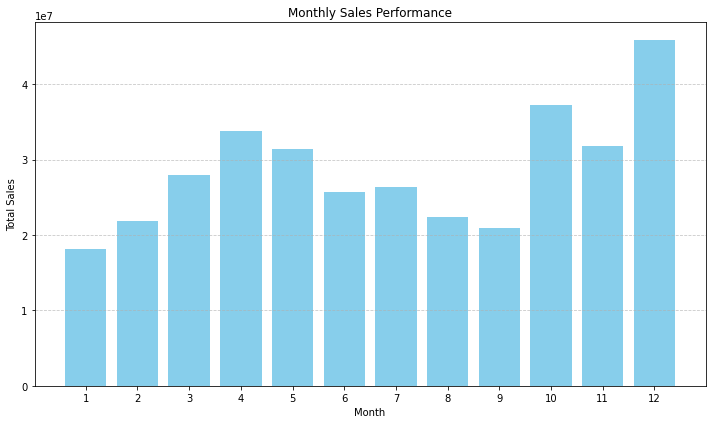

In [0]:
import matplotlib.pyplot as plt
monthly_sales_df = spark.sql("""
    SELECT months AS Month,
           SUM(PriceEach * Quantity) AS TotalSales
    FROM sales3
    GROUP BY months
    ORDER BY Month
""")

monthly_sales_pd = monthly_sales_df.toPandas()



plt.figure(figsize=(10,6))
plt.bar(monthly_sales_pd['Month'], monthly_sales_pd['TotalSales'], color='skyblue')
plt.xlabel("Month")
plt.ylabel("Total Sales")
plt.title("Monthly Sales Performance")
plt.xticks(monthly_sales_pd['Month'])  # Show all month numbers
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


# Q2. Which city sold the most products

In [0]:
%sql

select city,sum(quantity) as totalproducts
from sales3
group by City
order by totalproducts desc;

city,totalproducts
San Francisco,502390
Los Angeles,332890
New York City,279320
Boston,225280
Dallas,167300
Atlanta,166020
Seattle,165530
Portland,140530
Austin,111530


Databricks visualization. Run in Databricks to view.

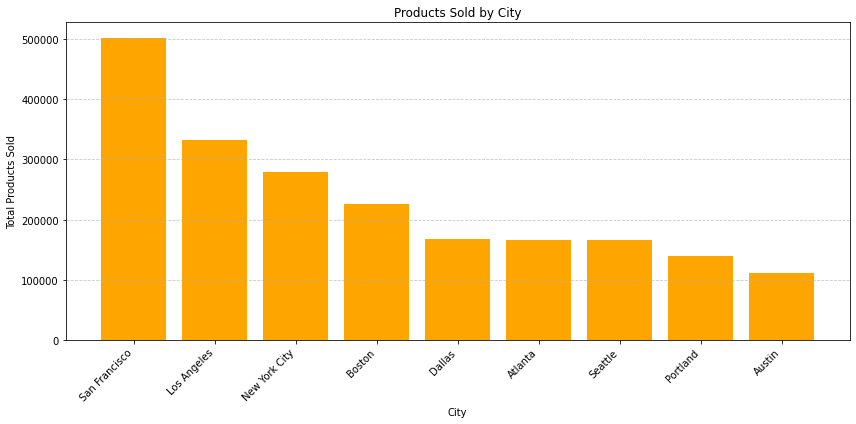

In [0]:
city_sales_df = spark.sql("""
    SELECT City,
           SUM(Quantity) AS TotalUnitsSold
    FROM sales3
    GROUP BY City
    ORDER BY TotalUnitsSold DESC
""")

city_sales_pd = city_sales_df.toPandas()



plt.figure(figsize=(12, 6))
plt.bar(city_sales_pd['City'], city_sales_pd['TotalUnitsSold'], color='orange')
plt.xlabel("City")
plt.ylabel("Total Products Sold")
plt.title("Products Sold by City")
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


# Q3. Total Revenue by each state

In [0]:
%sql
SELECT City, SUM(PriceEach * Quantity) AS total_revenue
FROM sales3
GROUP BY City
ORDER BY total_revenue DESC


City,total_revenue
San Francisco,82236690
Los Angeles,54269730
New York City,46428720
Boston,36443270
Atlanta,27828410
Dallas,27551170
Seattle,27350700
Portland,23097170
Austin,18110540


Databricks visualization. Run in Databricks to view.

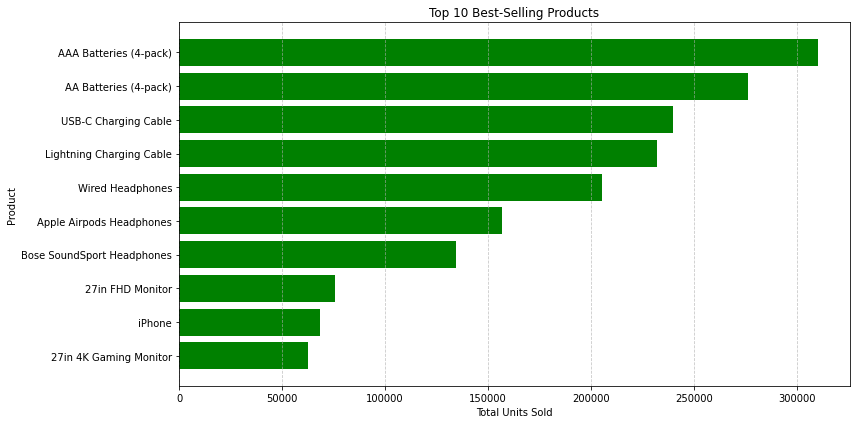

In [0]:
top_products_df = spark.sql("""
    SELECT Product, 
           SUM(Quantity) AS TotalUnitsSold
    FROM sales3
    GROUP BY Product
    ORDER BY TotalUnitsSold DESC
    LIMIT 10
""")

top_products_pd = top_products_df.toPandas()

plt.figure(figsize=(12, 6))
plt.barh(top_products_pd['Product'], top_products_pd['TotalUnitsSold'], color='green')
plt.xlabel("Total Units Sold")
plt.ylabel("Product")
plt.title("Top 10 Best-Selling Products")
plt.gca().invert_yaxis()  # So top-selling is at the top
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


# Q4. Average Order Value

In [0]:
%sql
    SELECT 
        City, 
        ROUND(SUM(PriceEach * Quantity) / COUNT(DISTINCT OrderId), 2) AS AvgOrderValue
    FROM sales3
    GROUP BY City
    ORDER BY AvgOrderValue DESC



City,AvgOrderValue
Atlanta,1952.46
New York City,1946.86
Seattle,1937.16
Dallas,1934.77
Portland,1927.98
San Francisco,1917.03
Boston,1908.82
Austin,1904.57
Los Angeles,1904.33


Databricks visualization. Run in Databricks to view.

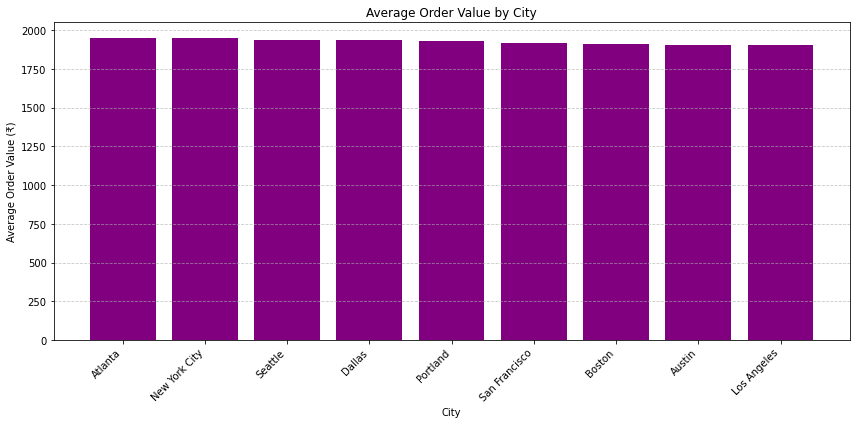

In [0]:
aov_df = spark.sql("""
    SELECT 
        City, 
        ROUND(SUM(PriceEach * Quantity) / COUNT(DISTINCT OrderId), 2) AS AvgOrderValue
    FROM sales3
    GROUP BY City
    ORDER BY AvgOrderValue DESC
""")

aov_pd = aov_df.toPandas()

plt.figure(figsize=(12, 6))
plt.bar(aov_pd['City'], aov_pd['AvgOrderValue'], color='purple')
plt.xlabel("City")
plt.ylabel("Average Order Value (₹)")
plt.title("Average Order Value by City")
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


# Q5. Number of orders per state

In [0]:
%sql
SELECT State, COUNT(DISTINCT OrderId) AS total_orders
FROM sales3
GROUP BY State
ORDER BY total_orders DESC


State,total_orders
CA,71396
NY,23848
TX,23749
MA,19092
GA,14253
WA,14119
OR,9617
ME,2363


Databricks visualization. Run in Databricks to view.

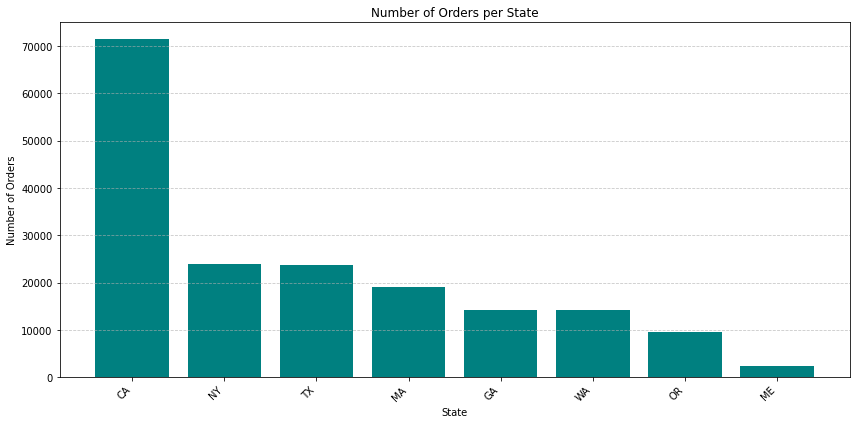

In [0]:
orders_by_state_df = spark.sql("""
    SELECT 
        State, 
        COUNT(DISTINCT OrderId) AS TotalOrders
    FROM sales3
    GROUP BY State
    ORDER BY TotalOrders DESC
""")

orders_by_state_pd = orders_by_state_df.toPandas()

plt.figure(figsize=(12, 6))
plt.bar(orders_by_state_pd['State'], orders_by_state_pd['TotalOrders'], color='teal')
plt.xlabel("State")
plt.ylabel("Number of Orders")
plt.title("Number of Orders per State")
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


# Q6. Number of orders per year

In [0]:
%sql
    SELECT ReportYear, COUNT(DISTINCT OrderId) AS total_orders
    FROM sales3
    GROUP BY ReportYear
    ORDER BY ReportYear



ReportYear,total_orders
2019,178406
2020,31


Databricks visualization. Run in Databricks to view.

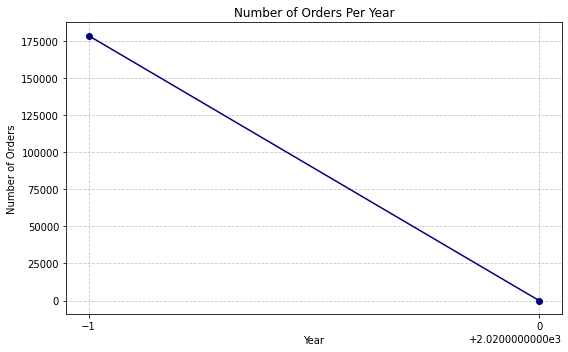

In [0]:
orders_per_year_df = spark.sql("""
    SELECT 
        ReportYear AS Year, 
        COUNT(DISTINCT OrderId) AS TotalOrders
    FROM sales3
    GROUP BY ReportYear
    ORDER BY Year
""")
orders_per_year_pd = orders_per_year_df.toPandas()

plt.figure(figsize=(8,5))
plt.plot(orders_per_year_pd['Year'], orders_per_year_pd['TotalOrders'], marker='o', linestyle='-', color='navy')
plt.xlabel("Year")
plt.ylabel("Number of Orders")
plt.title("Number of Orders Per Year")
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(orders_per_year_pd['Year'])
plt.tight_layout()
plt.show()

# Q7. Revenue contribution by each product

In [0]:
%sql
SELECT Product, SUM(PriceEach * Quantity) AS revenue_generated
FROM sales3
GROUP BY Product
ORDER BY revenue_generated DESC


Product,revenue_generated
Macbook Pro Laptop,80376000
iPhone,47943000
ThinkPad Laptop,41258700
Google Phone,33192000
27in 4K Gaming Monitor,24289160
34in Ultrawide Monitor,23494210
Apple Airpods Headphones,23491500
Flatscreen TV,14457000
Bose SoundSport Headphones,13322430
27in FHD Monitor,11249500


Databricks visualization. Run in Databricks to view.

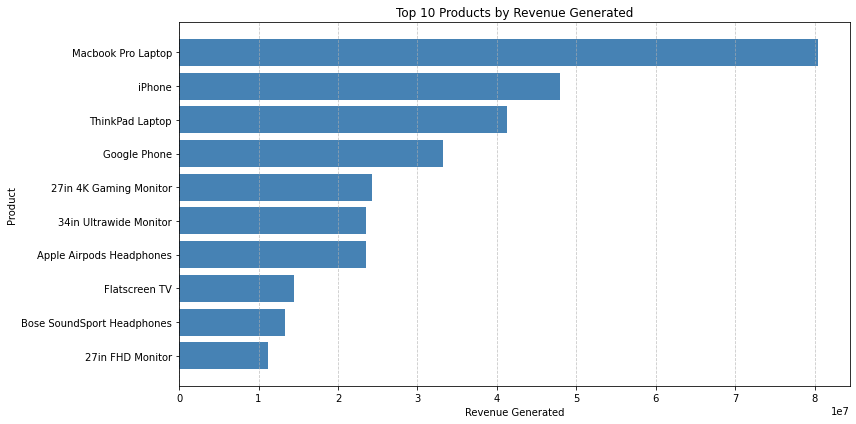

In [0]:
revenue_df = spark.sql("""
    SELECT Product, 
           SUM(PriceEach * Quantity) AS revenue_generated
    FROM sales3
    GROUP BY Product
    ORDER BY revenue_generated DESC
    LIMIT 10
""")
revenue_pd = revenue_df.toPandas()


plt.figure(figsize=(12,6))
plt.barh(revenue_pd['Product'], revenue_pd['revenue_generated'], color='steelblue')
plt.xlabel("Revenue Generated")
plt.ylabel("Product")
plt.title("Top 10 Products by Revenue Generated")
plt.gca().invert_yaxis()  # Highest revenue on top
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


# Q8. Monthly sales trend for a specific city

In [0]:
%sql
SELECT months, SUM(Quantity) AS total_sold
FROM sales3
WHERE LOWER(City) = 'boston'
GROUP BY months
ORDER BY months


months,total_sold
1,11740
2,14000
3,18810
4,21890
5,19910
6,16140
7,17720
8,14080
9,14560
10,24440


Databricks visualization. Run in Databricks to view.

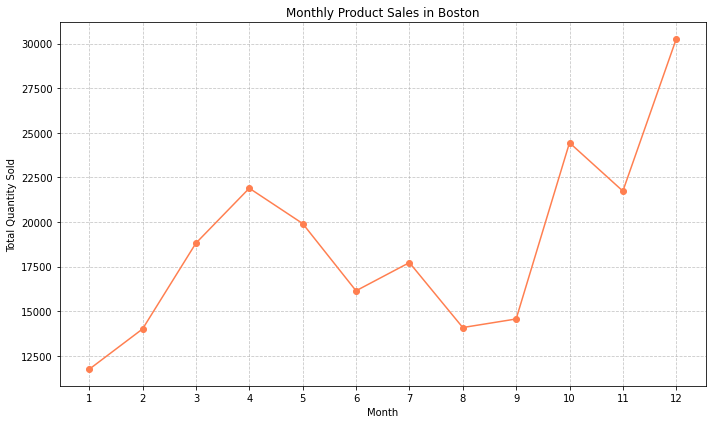

In [0]:
boston_monthly_sales_df = spark.sql("""
    SELECT months, 
           SUM(Quantity) AS total_sold
    FROM sales3
    WHERE LOWER(City) = 'boston'
    GROUP BY months
    ORDER BY months
""")
boston_monthly_sales_pd = boston_monthly_sales_df.toPandas()
plt.figure(figsize=(10,6))
plt.plot(boston_monthly_sales_pd['months'], boston_monthly_sales_pd['total_sold'], marker='o', color='coral')
plt.xlabel("Month")
plt.ylabel("Total Quantity Sold")
plt.title("Monthly Product Sales in Boston")
plt.xticks(boston_monthly_sales_pd['months'])
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Q9. Average quantity ordered per product

In [0]:
%sql
SELECT Product, AVG(Quantity) AS avg_quantity_ordered
FROM sales3
GROUP BY Product
ORDER BY avg_quantity_ordered DESC


Product,avg_quantity_ordered
AAA Batteries (4-pack),1.5026888232159294
AA Batteries (4-pack),1.343004325217476
USB-C Charging Cable,1.0945989133908598
Wired Headphones,1.0887088232178794
Lightning Charging Cable,1.07198263920953
Bose SoundSport Headphones,1.009906191369606
Apple Airpods Headphones,1.0072030355649881
20in Monitor,1.0068276030236527
27in FHD Monitor,1.0057279872119356
Flatscreen TV,1.0039583333333333


Databricks visualization. Run in Databricks to view.

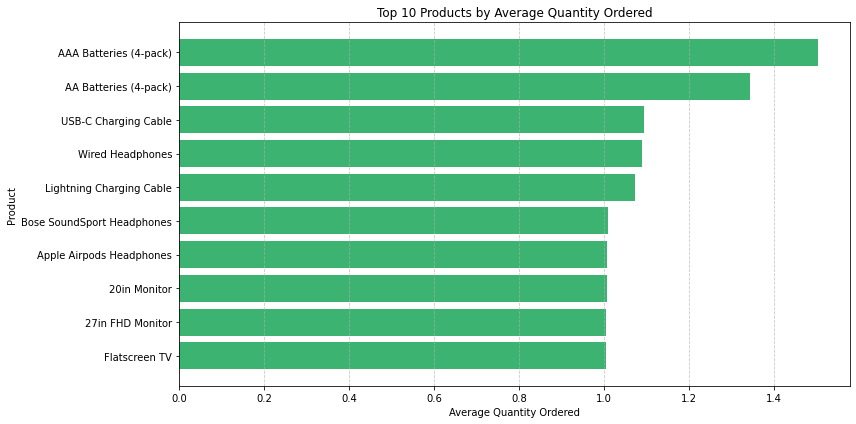

In [0]:
avg_quantity_df = spark.sql("""
    SELECT Product, 
           AVG(Quantity) AS avg_quantity_ordered
    FROM sales3
    GROUP BY Product
    ORDER BY avg_quantity_ordered DESC
    LIMIT 10
""")
avg_quantity_pd = avg_quantity_df.toPandas()


plt.figure(figsize=(12,6))
plt.barh(avg_quantity_pd['Product'], avg_quantity_pd['avg_quantity_ordered'], color='mediumseagreen')
plt.xlabel("Average Quantity Ordered")
plt.ylabel("Product")
plt.title("Top 10 Products by Average Quantity Ordered")
plt.gca().invert_yaxis()  # Highest average on top
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


# Q10. Percentage Contribution of Each Product to Total Revenue

In [0]:
%sql
SELECT 
    Product, 
    ROUND(SUM(PriceEach * Quantity) * 100 / (SELECT SUM(PriceEach * Quantity) FROM sales3), 2) AS revenue_percent
FROM sales3
GROUP BY Product
ORDER BY revenue_percent DESC


Product,revenue_percent
Macbook Pro Laptop,23.41
iPhone,13.96
ThinkPad Laptop,12.02
Google Phone,9.67
27in 4K Gaming Monitor,7.07
Apple Airpods Headphones,6.84
34in Ultrawide Monitor,6.84
Flatscreen TV,4.21
Bose SoundSport Headphones,3.88
27in FHD Monitor,3.28


Databricks visualization. Run in Databricks to view.

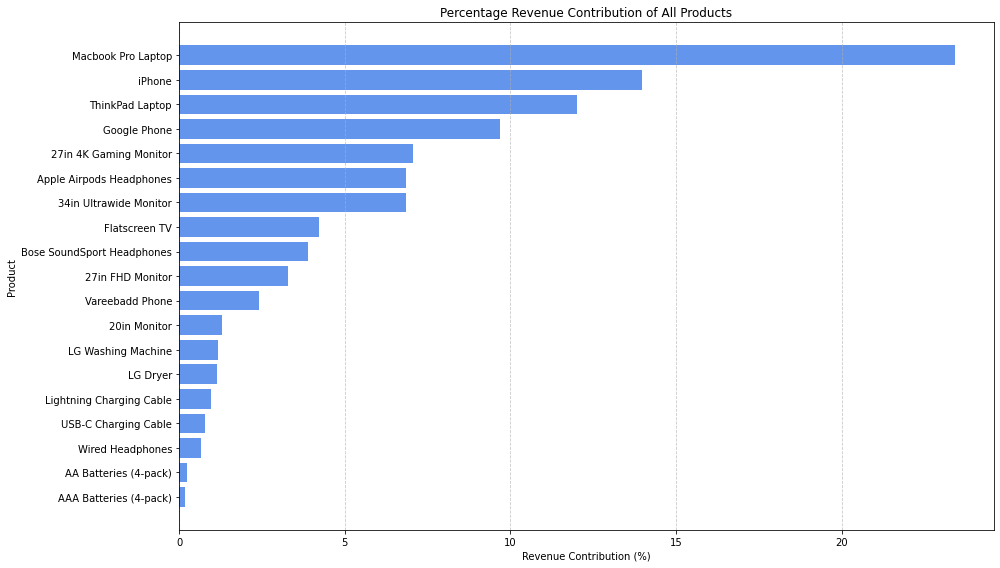

In [0]:
revenue_percent_df = spark.sql("""
    SELECT 
        Product, 
        ROUND(SUM(PriceEach * Quantity) * 100 / (SELECT SUM(PriceEach * Quantity) FROM sales3), 2) AS revenue_percent
    FROM sales3
    GROUP BY Product
    ORDER BY revenue_percent DESC
""")
revenue_percent_pd = revenue_percent_df.toPandas()


plt.figure(figsize=(14,8))
plt.barh(revenue_percent_pd['Product'], revenue_percent_pd['revenue_percent'], color='cornflowerblue')
plt.xlabel('Revenue Contribution (%)')
plt.ylabel('Product')
plt.title('Percentage Revenue Contribution of All Products')
plt.gca().invert_yaxis()  # Highest contribution on top
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [0]:
%sql
SELECT 
    OrderId, 
    COUNT(*) AS orderID_count
FROM sales3
GROUP BY OrderId
ORDER BY orderID_count DESC


OrderId,orderID_count
160873,50
165665,40
277875,40
304802,40
289117,40
312407,40
193511,40
263918,40
296353,40
196615,40


# Q11. Get the total number of product based on each quantity of order

In [0]:
%sql
SELECT 
    Quantity, 
    COUNT(Product) AS total_products
FROM sales3
GROUP BY Quantity
ORDER BY Quantity


Quantity,total_products
1,1685520
2,133240
3,29200
4,8060
5,2360
6,800
7,240
8,50
9,30


Databricks visualization. Run in Databricks to view.

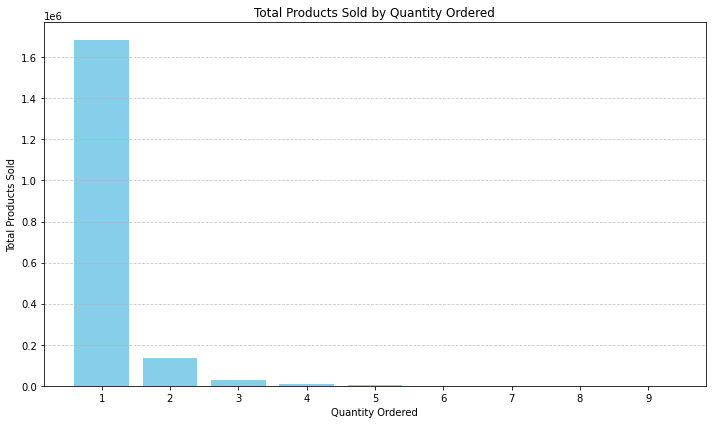

In [0]:
# Run SQL and convert to Pandas DataFrame
quantity_product_df = spark.sql("""
    SELECT 
        Quantity, 
        COUNT(Product) AS total_products
    FROM sales3
    GROUP BY Quantity
    ORDER BY Quantity
""").toPandas()

plt.figure(figsize=(10, 6))
plt.bar(quantity_product_df['Quantity'], quantity_product_df['total_products'], color='skyblue')
plt.xlabel('Quantity Ordered')
plt.ylabel('Total Products Sold')
plt.title('Total Products Sold by Quantity Ordered')
plt.xticks(quantity_product_df['Quantity'])  # Show all quantities as x-ticks
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


# Q12. Get the total number of orders placed for quantity order 1 which has been sold on consecutive order days

In [0]:
from pyspark.sql.functions import col, to_date, count, lag, datediff
from pyspark.sql.window import Window

# Load the sales3 table
sales_df = spark.table("sales3")

# Step 1: Filter rows where Quantity is 1
df_q1 = sales_df.filter(col("Quantity") == 1)

# Step 2: Extract date only from OrderDate
df_q1_date = df_q1.withColumn("OrderDay", to_date(col("OrderDate")))

# Step 3: Count number of Quantity=1 orders per day
orders_per_day = df_q1_date.groupBy("OrderDay") \
    .agg(count("*").alias("OrdersCount")) \
    .orderBy("OrderDay")

# Step 4: Use window function to get previous day
windowSpec = Window.orderBy("OrderDay")
orders_with_lag = orders_per_day.withColumn("PrevDay", lag("OrderDay").over(windowSpec))

# Step 5: Filter rows where current day is consecutive to previous
consecutive_orders = orders_with_lag.filter(datediff(col("OrderDay"), col("PrevDay")) == 1)

# Step 6: Sum the number of Quantity=1 orders that fall on consecutive days
total_orders = consecutive_orders.agg({"OrdersCount": "sum"}).collect()[0][0]

# Step 7: Print the result
print(f"✅ Total number of Quantity=1 orders on consecutive days: {total_orders}")


✅ Total number of Quantity=1 orders on consecutive days: 1682820


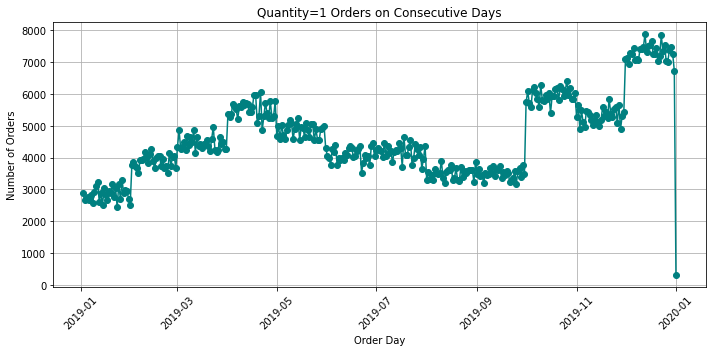

In [0]:
import matplotlib.pyplot as plt
from pyspark.sql.functions import col, to_date, count, lag, datediff
from pyspark.sql.window import Window

# Load the sales3 table
sales_df = spark.table("sales3")

# Step 1: Filter for Quantity = 1
df_q1 = sales_df.filter(col("Quantity") == 1)

# Step 2: Convert OrderDate to OrderDay
df_q1_date = df_q1.withColumn("OrderDay", to_date(col("OrderDate")))

# Step 3: Count orders per day
orders_per_day = df_q1_date.groupBy("OrderDay") \
    .agg(count("*").alias("OrdersCount")) \
    .orderBy("OrderDay")

# Step 4: Window lag to find previous day
windowSpec = Window.orderBy("OrderDay")
orders_with_lag = orders_per_day.withColumn("PrevDay", lag("OrderDay").over(windowSpec))

# Step 5: Filter for consecutive days
consecutive_orders = orders_with_lag.filter(datediff(col("OrderDay"), col("PrevDay")) == 1)

# ✅ Collect data for plotting
plot_data = consecutive_orders.select("OrderDay", "OrdersCount").toPandas()

# Step 6: Plot with matplotlib
plt.figure(figsize=(10, 5))
plt.plot(plot_data["OrderDay"], plot_data["OrdersCount"], marker='o', color='teal')
plt.xticks(rotation=45)
plt.title("Quantity=1 Orders on Consecutive Days")
plt.xlabel("Order Day")
plt.ylabel("Number of Orders")
plt.tight_layout()
plt.grid(True)
plt.show()


# Q13. Find the top 3 products which has been sold together

In [0]:
%sql
with product_pairs as (
  select
    CASE WHEN a.Product < b.Product THEN a.Product ELSE b.Product END AS Product1,
    CASE WHEN a.Product < b.Product THEN b.Product ELSE a.Product END AS Product2
  FROM sales a
  JOIN sales b
    ON a.OrderId = b.OrderId
    AND a.Product < b.Product
)
select Product1, Product2, COUNT(*) AS pair_count
from product_pairs
group by Product1, Product2
order by pair_count DESC
limit 10;

Product1,Product2,pair_count
Lightning Charging Cable,iPhone,1015
Google Phone,USB-C Charging Cable,999
Wired Headphones,iPhone,462
Google Phone,Wired Headphones,423
Apple Airpods Headphones,iPhone,373
USB-C Charging Cable,Vareebadd Phone,368
Bose SoundSport Headphones,Google Phone,228
USB-C Charging Cable,Wired Headphones,205
Vareebadd Phone,Wired Headphones,149
Lightning Charging Cable,Wired Headphones,129
